In [24]:
import pandas as pd

In [25]:
# now we can use the normalized weights to calculate the liveability score for each suburb

data = pd.read_csv('../../data/curated/Processed Data Final.csv')

In [26]:
# lower case all columns
data.columns = map(str.lower, data.columns)

# replace spaces with underscores in column names
data.columns = data.columns.str.replace(' ', '_')


In [27]:
data2024 = data[data['year'] == 2024]

In [28]:
data2024.columns

Index(['distance_to_cbd', 'time_to_cbd', 'distance_to_station',
       'time_to_station', 'year', 'average_household_size',
       'average_num_psns_per_bedroom', 'median_age_persons', 'tot_p_p',
       'average_quarterly_count', 'sal_code', 'median_score', 'average_price',
       'proximity_to_beach', 'airbnb_count', 'commercial_density',
       'education_density', 'food_establishments_density',
       'healthcare_density', 'industrial_density', 'public_transport_density',
       'recreation_density', 'residential_density', 'shopping_density',
       'pop_density', 'interest_rate', 'median_tot_fam_inc_weekly/inflation',
       'median_tot_hhd_inc_weekly/inflation',
       'median_tot_prsnl_inc_weekly/inflation', 'gdp_cbd/inflation/beach',
       'gdp_cbd/inflation/cbd', 'gpd/inflation/airbnb',
       'average_weekly_rent/inflation/household_size',
       'a_crimes_against_the_person/per_person',
       'b_property_and_deception_offences/per_person',
       'c_drug_offences/per_person

In [29]:
import pandas as pd

# Current list of variables
variables = [
    'distance_to_cbd', 'time_to_cbd', 'distance_to_station',
    'time_to_station', 'year', 'average_household_size',
    'average_num_psns_per_bedroom', 'median_age_persons', 'tot_p_p',
    'sal_code', 'median_score', 'average_price',
    'proximity_to_beach', 'airbnb_count', 'commercial_density',
    'education_density', 'food_establishments_density',
    'healthcare_density', 'industrial_density', 'public_transport_density',
    'recreation_density', 'residential_density', 'shopping_density',
    'pop_density', 'interest_rate', 'median_tot_fam_inc_weekly/inflation',
    'median_tot_hhd_inc_weekly/inflation',
    'median_tot_prsnl_inc_weekly/inflation', 'gdp_cbd/inflation/beach',
    'gdp_cbd/inflation/cbd', 'gpd/inflation/airbnb',
    'average_weekly_rent/inflation/household_size',
    'a_crimes_against_the_person/per_person',
    'b_property_and_deception_offences/per_person',
    'c_drug_offences/per_person',
    'd_public_order_and_security_offences/per_person',
    'e_justice_procedures_offences/per_person',
    'f_other_offences/per_person'
]

# Existing coefficients_dict with base variables
coefficients_dict = {
    'distance_to_cbd': 0,
    'time_to_cbd': -0.6,
    'distance_to_station': 0,
    'time_to_station': -0.5,
    'cemeteries': -0.2,
    'civic_squares_and_promenades': 0.1,
    'conservation_reserves': 0.1,
    'government_schools': 0.2,
    'natural_and_semi-natural_open_space': 0.2,
    'non-government_schools': 0.2,
    'parks_and_gardens': 0.3,
    'public_housing_reserves': -0.8,
    'recreation_corridor': 0.2,
    'services_and_utilities_reserves': 0.3,
    'sportsfields_and_organised_recreation': 0.4,
    'tertiary_institutions': 0.3,
    'transport_reservations': -0.2,
    'year': 0.0,
    'average_household_size': 0.1,
    'average_num_psns_per_bedroom': -0.1,
    'median_age_persons': 0.0,
    'tot_p_p': 0.0,
    'average_quarterly_count': 0.0,
    'commercial': 0.5,
    'education': 0.1,
    'food_establishments': 0.1,
    'healthcare': 0.4,
    'industrial': -1.5,
    'public_transport': 0.1,
    'recreation': 0.3,
    'residential': 0.2,
    'shopping': 0.3,
    'sal_code': 0.0,
    'median_score': 0.9,
    'average_price': 0.3,
    'proximity_to_beach': -0.8,
    'interest_rate': 0.0,
    'median_tot_fam_inc_weekly/inflation': 0.7,
    'median_tot_hhd_inc_weekly/inflation': 0.7,
    'median_tot_prsnl_inc_weekly/inflation': 0.7,
    'gdp_cbd/inflation/beach': -0.2,
    'a_crimes_against_the_person/per_person': -2,
    'b_property_and_deception_offences/per_person': -1,
    'c_drug_offences/per_person': -1.8,
    'd_public_order_and_security_offences/per_person': -0.6,
    'e_justice_procedures_offences/per_person': -0.7,
    'f_other_offences/per_person': -0.6
}

# Initialize a new dictionary for the current variables with adjusted coefficients
new_coefficients_dict = {}

for var in variables:
    if var.endswith('_density'):
        # Extract the base variable name
        base_var = var[:-8]  # Removes '_density'
        # Assign the coefficient of the base variable if it exists
        coeff = coefficients_dict.get(base_var, 0)
        new_coefficients_dict[var] = coeff
    else:
        # Assign the coefficient directly if it exists
        coeff = coefficients_dict.get(var, 0)
        new_coefficients_dict[var] = coeff

# Display the new coefficients mapping
print("New Coefficients Mapping:")
for var, coeff in new_coefficients_dict.items():
    print(f"{var}: {coeff}")


New Coefficients Mapping:
distance_to_cbd: 0
time_to_cbd: -0.6
distance_to_station: 0
time_to_station: -0.5
year: 0.0
average_household_size: 0.1
average_num_psns_per_bedroom: -0.1
median_age_persons: 0.0
tot_p_p: 0.0
sal_code: 0.0
median_score: 0.9
average_price: 0.3
proximity_to_beach: -0.8
airbnb_count: 0
commercial_density: 0.5
education_density: 0.1
food_establishments_density: 0.1
healthcare_density: 0.4
industrial_density: -1.5
public_transport_density: 0.1
recreation_density: 0.3
residential_density: 0.2
shopping_density: 0.3
pop_density: 0
interest_rate: 0.0
median_tot_fam_inc_weekly/inflation: 0.7
median_tot_hhd_inc_weekly/inflation: 0.7
median_tot_prsnl_inc_weekly/inflation: 0.7
gdp_cbd/inflation/beach: -0.2
gdp_cbd/inflation/cbd: 0
gpd/inflation/airbnb: 0
average_weekly_rent/inflation/household_size: 0
a_crimes_against_the_person/per_person: -2
b_property_and_deception_offences/per_person: -1
c_drug_offences/per_person: -1.8
d_public_order_and_security_offences/per_person: 

In [30]:
from sklearn.preprocessing import StandardScaler

# standardise the data
# Exclude 'sal_code' from standardization
columns_to_standardize = [col for col in variables if col != 'sal_code']

# Initialize the StandardScaler
scaler = StandardScaler()

# Standardize the data
data2024[columns_to_standardize] = scaler.fit_transform(data2024[columns_to_standardize])

/var/folders/fs/vr0v8fg954v34lfdwzxjyd900000gn/T/ipykernel_83728/3497166929.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2024[columns_to_standardize] = scaler.fit_transform(data2024[columns_to_standardize])


In [31]:
# weight the features
data2024['liveability_score'] = 0

for i in (new_coefficients_dict.keys()):
    data2024['liveability_score'] += new_coefficients_dict[i] * data2024[i]
# group suburb by sal_code and calculate the mean liveability score
suburbs = data2024.groupby('sal_code').mean()

suburbs.reset_index(inplace=True)
    

/var/folders/fs/vr0v8fg954v34lfdwzxjyd900000gn/T/ipykernel_83728/445044307.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2024['liveability_score'] = 0
/var/folders/fs/vr0v8fg954v34lfdwzxjyd900000gn/T/ipykernel_83728/445044307.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2024['liveability_score'] += new_coefficients_dict[i] * data2024[i]


In [32]:
# merge with shapefile find name

import geopandas as gpd
SAL = gpd.read_file("../../data/landing/SAL_2021_AUST_GDA2020.shp")

In [33]:
# Filter out non-numeric values
SAL = SAL[SAL['SAL_CODE21'].apply(lambda x: x.isnumeric())]

# Ensure 'SAL_CODE21' is of type int in SAL GeoDataFrame
SAL['SAL_CODE21'] = SAL['SAL_CODE21'].astype(int)

# Merge top_ten with SAL GeoDataFrame on 'sal_code' and 'SAL_CODE21'
suburbs = SAL.merge(suburbs, left_on='SAL_CODE21', right_on='sal_code')


# Get top ten suburbs by liveability score
top_ten = suburbs.nlargest(10, 'liveability_score')
bottom_ten = suburbs.nsmallest(10, 'liveability_score')
print(top_ten[['sal_code', 'liveability_score']])

     sal_code  liveability_score
79      20468          14.773933
60      20337          13.177023
276     21677          12.863727
12      20066          12.730818
266     21629          12.727558
199     21152          12.672912
420     22547          12.233129
181     21010          12.088864
329     22016          11.981344
89      20523          11.308802


In [34]:
bottom_ten['liveability_score']

41    -39.830659
176   -36.753450
88    -36.055177
293   -32.793555
24    -30.366898
277   -27.376520
22    -24.691274
269   -23.669923
375   -23.650013
401   -23.082828
Name: liveability_score, dtype: float64

In [35]:
top_ten['liveability_score']

79     14.773933
60     13.177023
276    12.863727
12     12.730818
266    12.727558
199    12.672912
420    12.233129
181    12.088864
329    11.981344
89     11.308802
Name: liveability_score, dtype: float64

In [36]:
top_ten['SAL_NAME21']

79      Canterbury (Vic.)
60        Brighton (Vic.)
276    Middle Park (Vic.)
12        Armadale (Vic.)
266              McKinnon
199       Hawthorn (Vic.)
420                Toorak
181      Glen Iris (Vic.)
329                Ormond
89        Caulfield North
Name: SAL_NAME21, dtype: object

In [37]:
bottom_ten['SAL_NAME21']

41              Bendigo
176             Geelong
88       Caulfield East
293             Morwell
24     Ballarat Central
277             Mildura
22           Bairnsdale
269       Melton (Vic.)
375      Seymour (Vic.)
401     Sunshine (Vic.)
Name: SAL_NAME21, dtype: object

In [38]:
import folium
import geopandas as gpd

# Create a Folium map centered around Melbourne
m = folium.Map(location=[-37.8136, 144.9631], zoom_start=10)

# Function to style top 10 and bottom 10 differently using hex codes based on livability score
def style_function(feature):
    sal_code = feature['properties']['SAL_CODE21']  # Get SAL_CODE21 from GeoJSON properties
    if sal_code in top_10_suburbs['SAL_CODE21'].values:
        return {
            'fillColor': 'green',    # Bright green (hex code for bright green)
            'color': 'black',          # Black border
            'weight': 1,
            'fillOpacity': 0.7
        }
    elif sal_code in bottom_10_suburbs['SAL_CODE21'].values:
        return {
            'fillColor': 'red',    # Bright red (hex code for bright red)
            'color': 'black',          # Black border
            'weight': 1,
            'fillOpacity': 0.7
        }
    else:
        return {
            'fillColor': '#808080',    # Gray (hex code for gray for other suburbs)
            'color': 'black',
            'weight': 0.5,
            'fillOpacity': 0.1
        }

# Extract the top 10 and bottom 10 suburbs by livability score
top_10_suburbs = suburbs.nlargest(10, 'liveability_score')
bottom_10_suburbs = suburbs.nsmallest(10, 'liveability_score')

# Add boundaries of all suburbs and apply color styling to top 10 and bottom 10 suburbs
folium.GeoJson(
    data=suburbs.to_json(),  # Converts the GeoDataFrame to GeoJSON format
    style_function=style_function
).add_to(m)

# Save the map as an HTML file
m.save("../../plots/melbourne_most_least_livability.html")

# Display the map
m


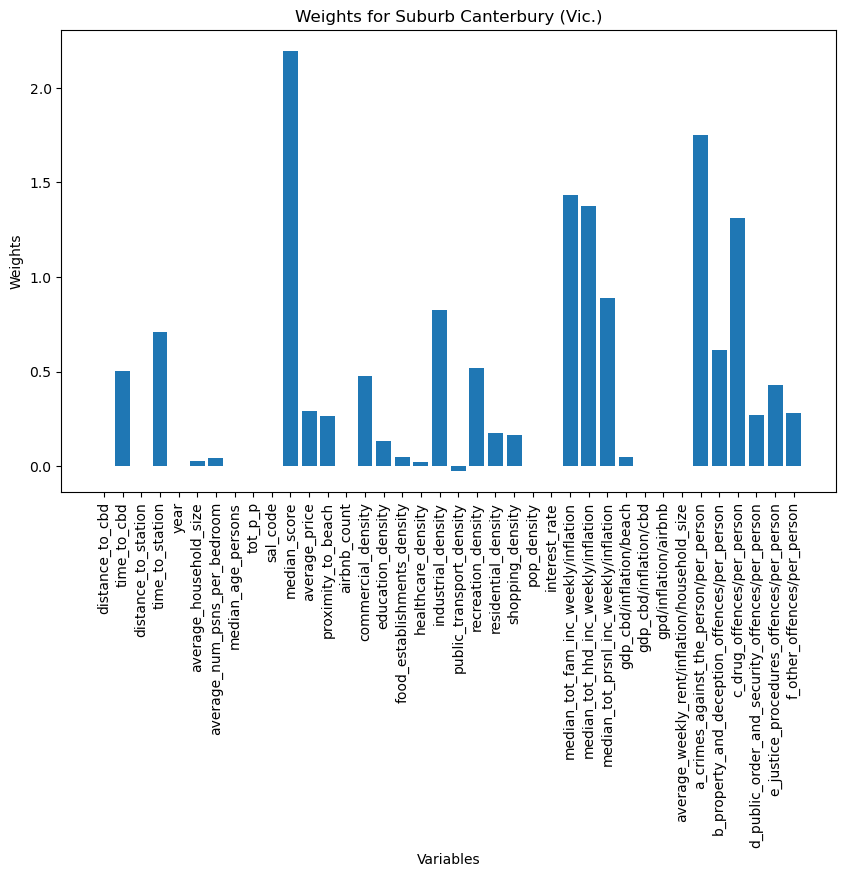

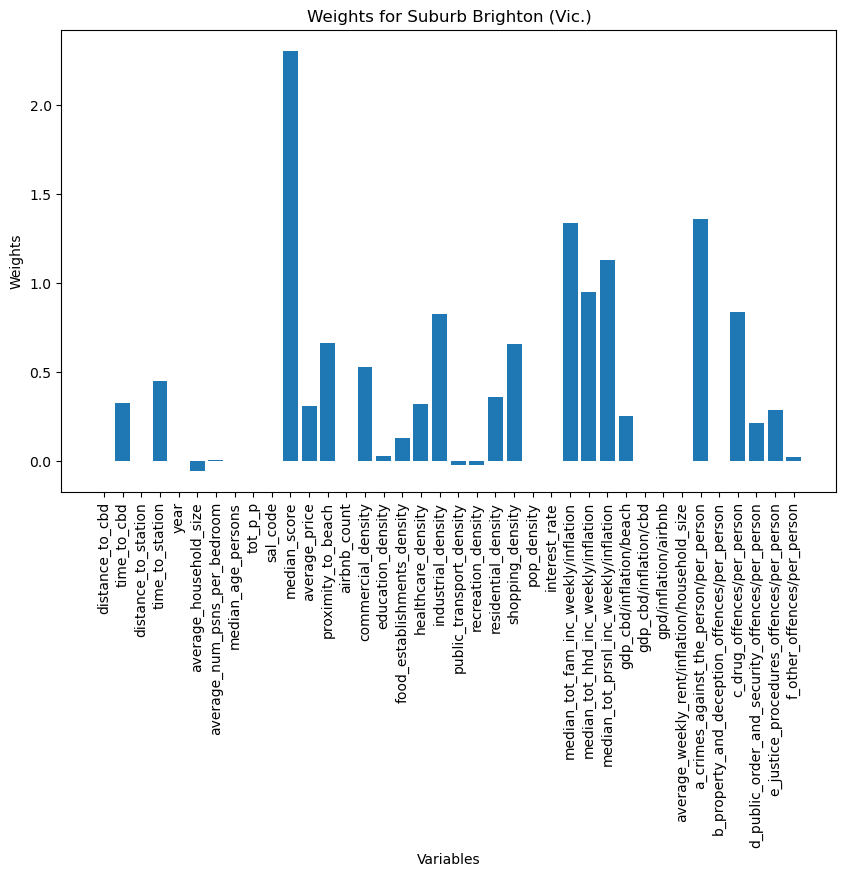

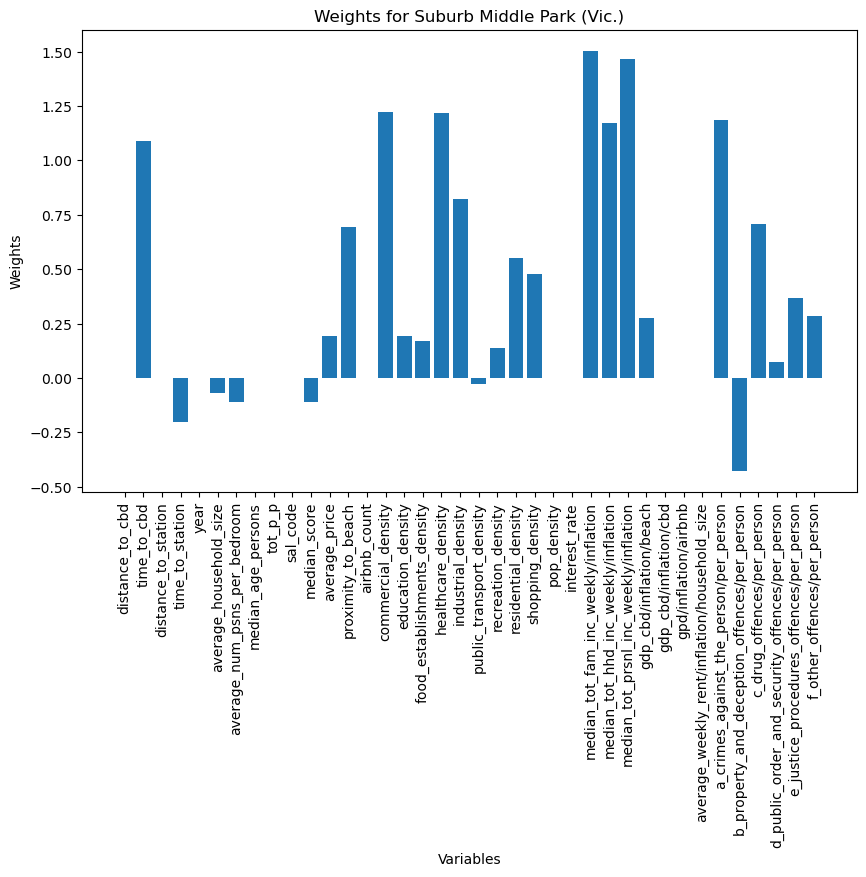

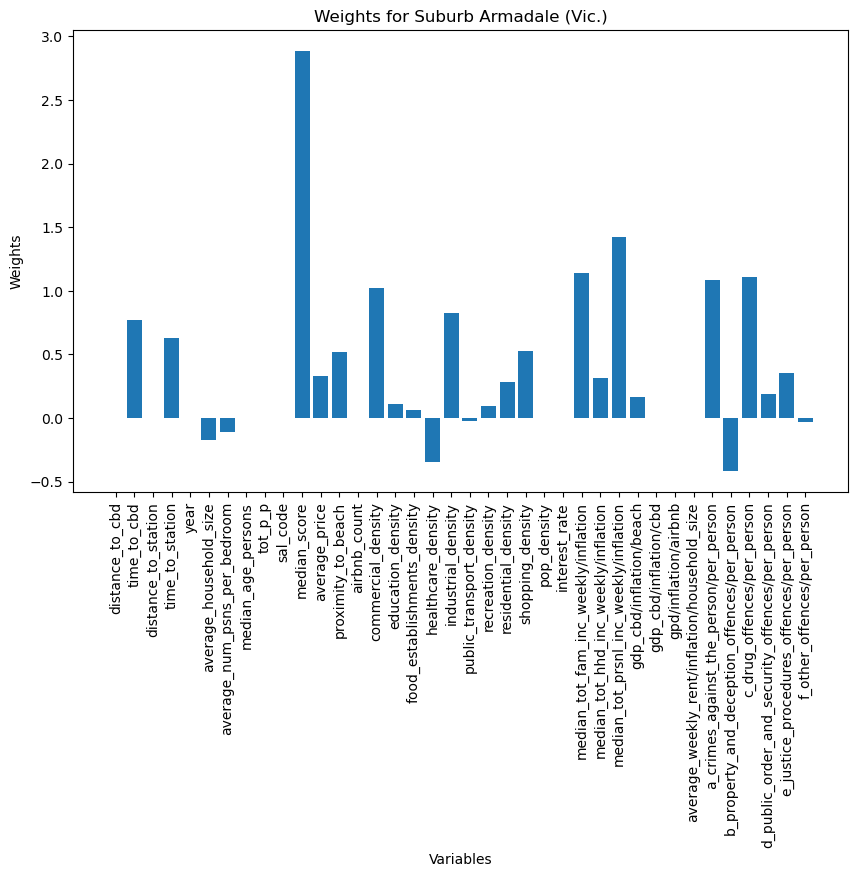

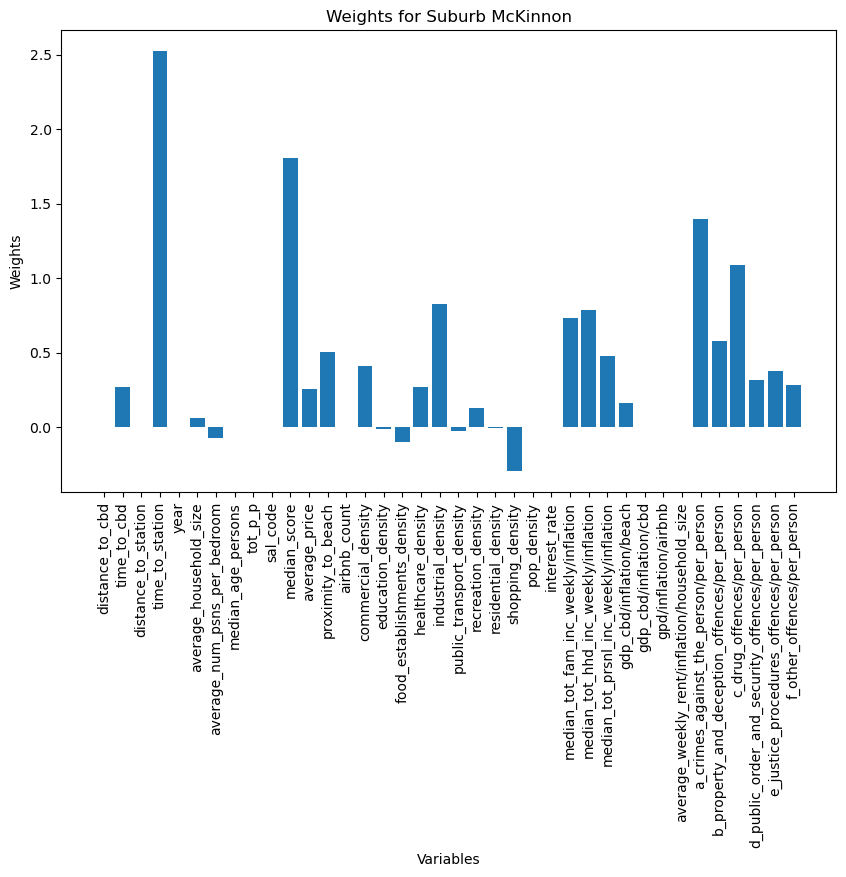

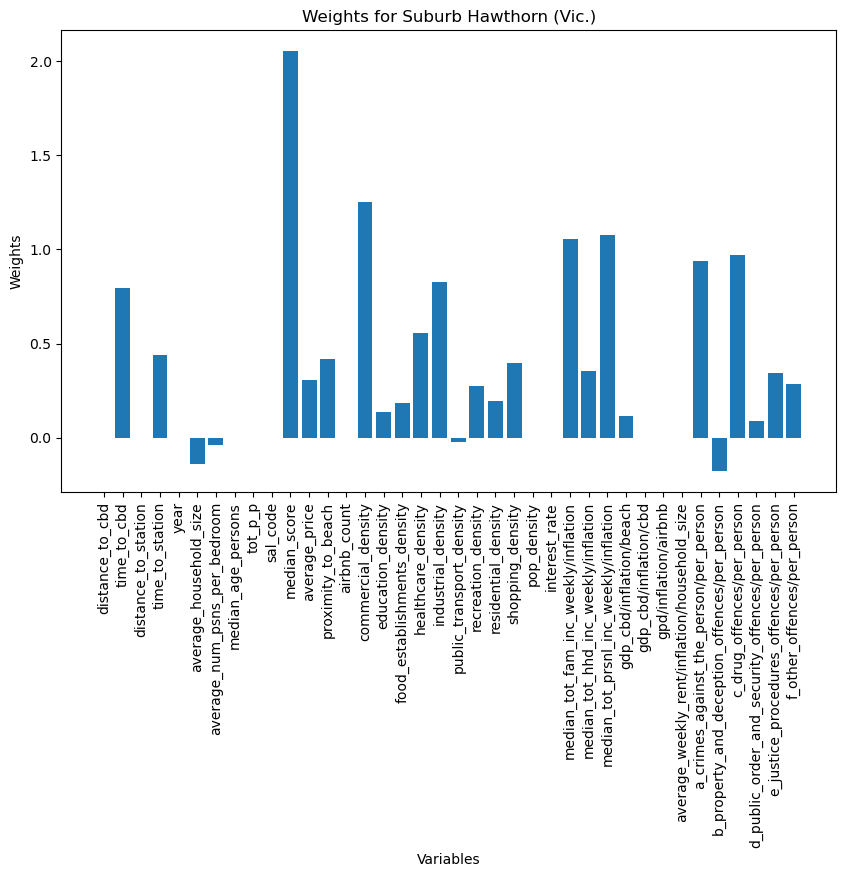

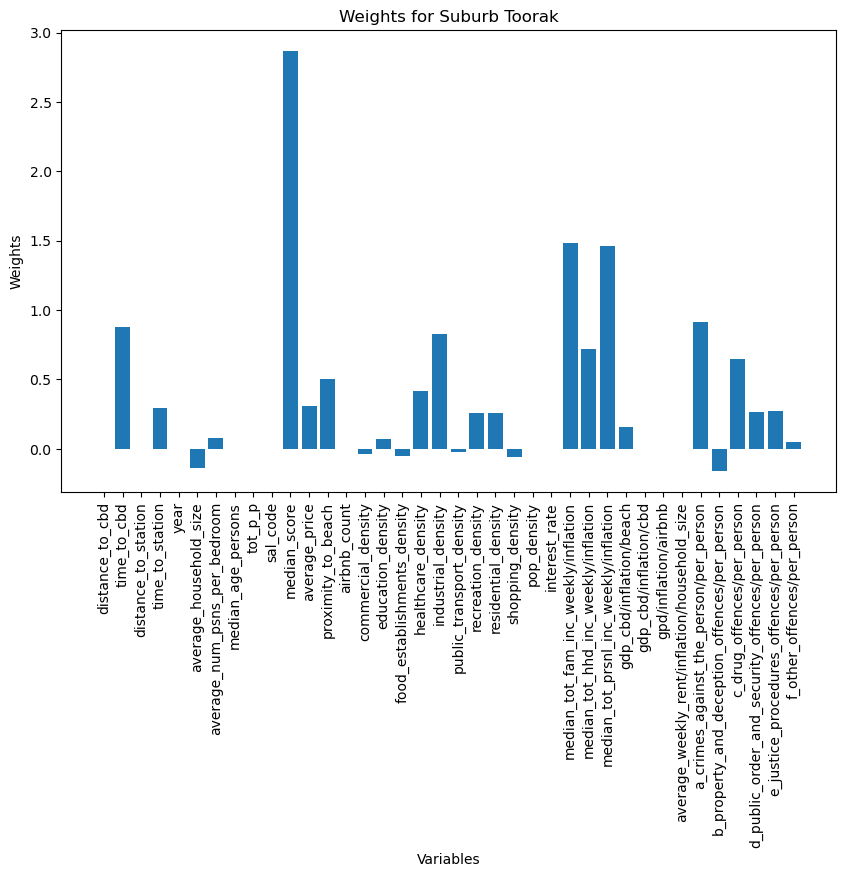

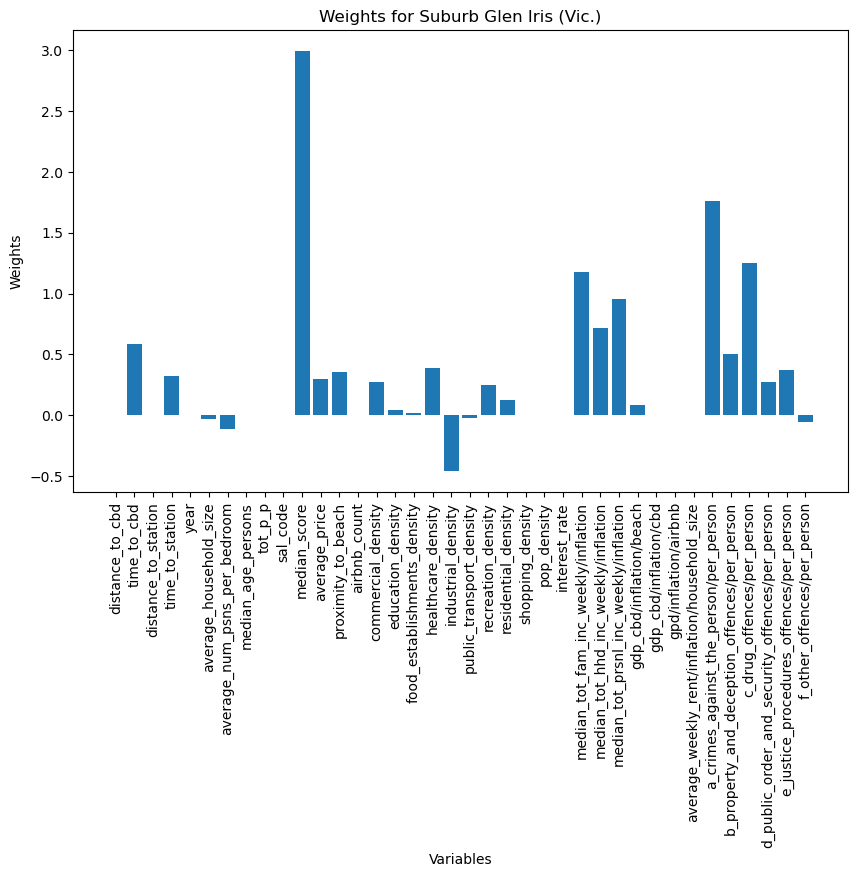

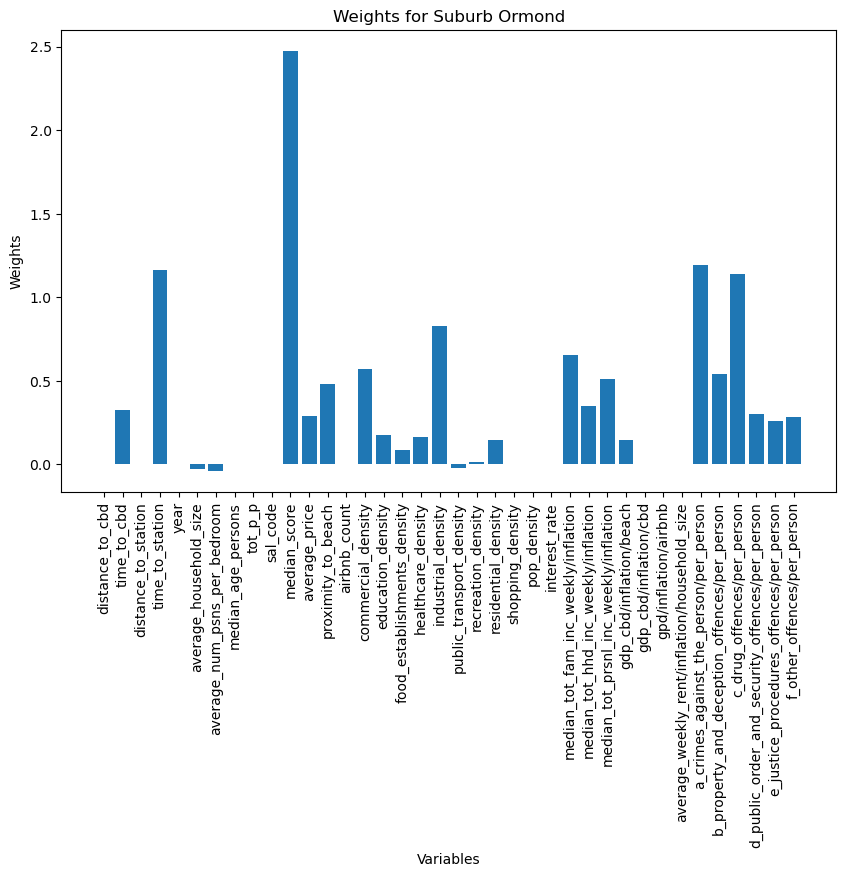

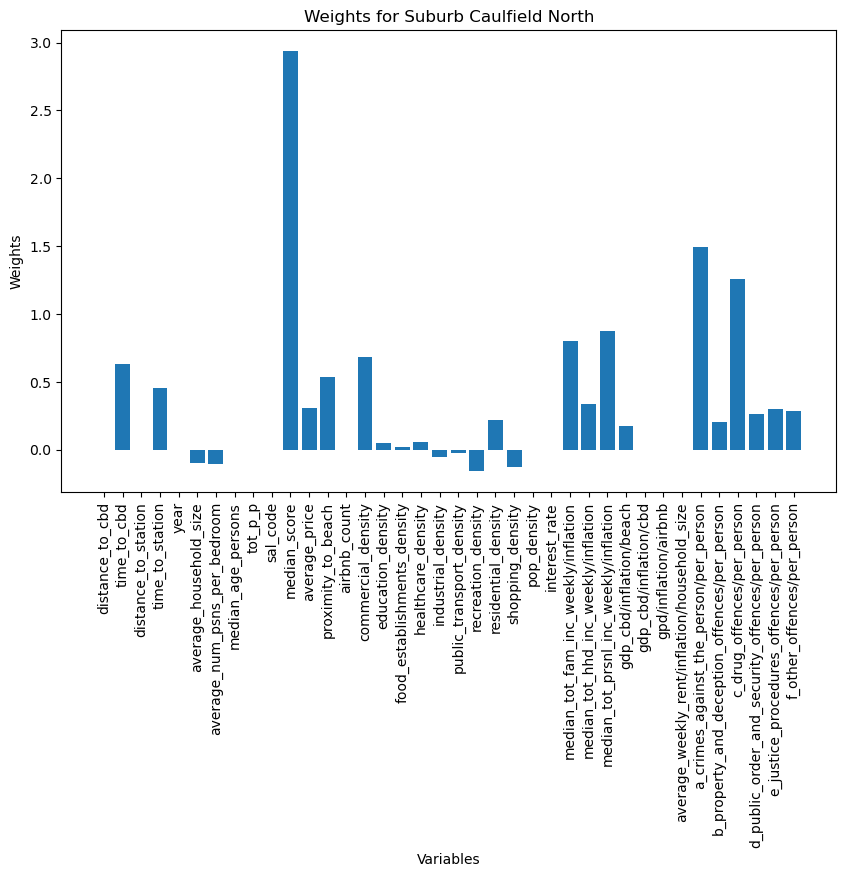

In [39]:
import os

# get weights for the top top_ten
# for every suburb in the top ten, get the weights for each feature
# and graph

# Create directory if it doesn't already exist
output_dir = '../plots/liveability/suburb_weights'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

import matplotlib.pyplot as plt

# Get the weights for the top ten suburbs
for index, row in list(top_ten.iterrows())[:15]:
    sal_code = row['SAL_NAME21']

    # Get the weights for the suburb
    weights = []

    for i in (new_coefficients_dict.keys()):
        weight = new_coefficients_dict[i] * row[i]
        weights.append(weight)
    
    # Plot the weights
    plt.figure(figsize=(10, 6))
    plt.bar(variables, weights)
    plt.xlabel('Variables')
    plt.ylabel('Weights')
    plt.title(f'Weights for Suburb {sal_code}')
    plt.xticks(rotation=90)

    # Save the plot
    plt.savefig(f'{output_dir}/weights_{sal_code}.png')
    plt.show()




In [40]:

# for better visualisaiton, remove suburbs too far outside melbourne
# Compute distance to Melbourne CBD
from math import sqrt
from math import asin, radians
from numpy import sin, cos


melbourne_cbd_coords = (-37.8136, 144.9631)  # Latitude and Longitude of Melbourne CBD

# Function to calculate distance
def haversine(lat1, lon1, lat2, lon2):
    # convert decimal degrees to radians
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])
    # haversine formula
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    r = 6371  # Radius of earth in kilometers
    return c * r

# Apply the function to calculate distance to Melbourne CBD
suburbs['distance_to_CBD'] = suburbs.apply(lambda row: haversine(row['geometry'].centroid.y, row['geometry'].centroid.x, melbourne_cbd_coords[0], melbourne_cbd_coords[1]), axis=1)

# Filter out suburbs too far outside Melbourne (e.g., more than 50 km)
suburbs = suburbs[suburbs['distance_to_CBD'] <= 100]

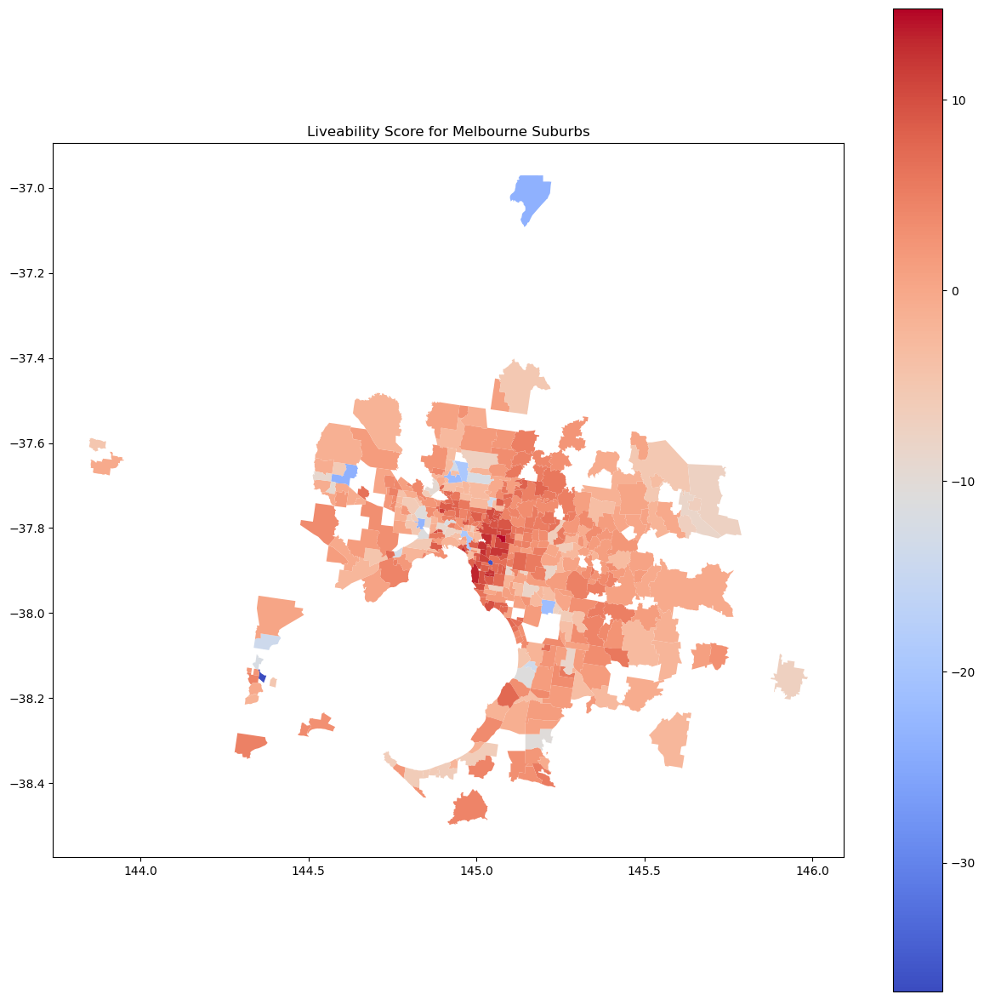

In [41]:


# graph top 10 residuals
fig, ax = plt.subplots(figsize=(15, 15))
suburbs.plot(column='liveability_score', ax=ax, legend=True, cmap='coolwarm')
plt.title('Liveability Score for Melbourne Suburbs')

# Save the plot
plt.savefig(f'../plots/liveability_score_map.png')

plt.show()

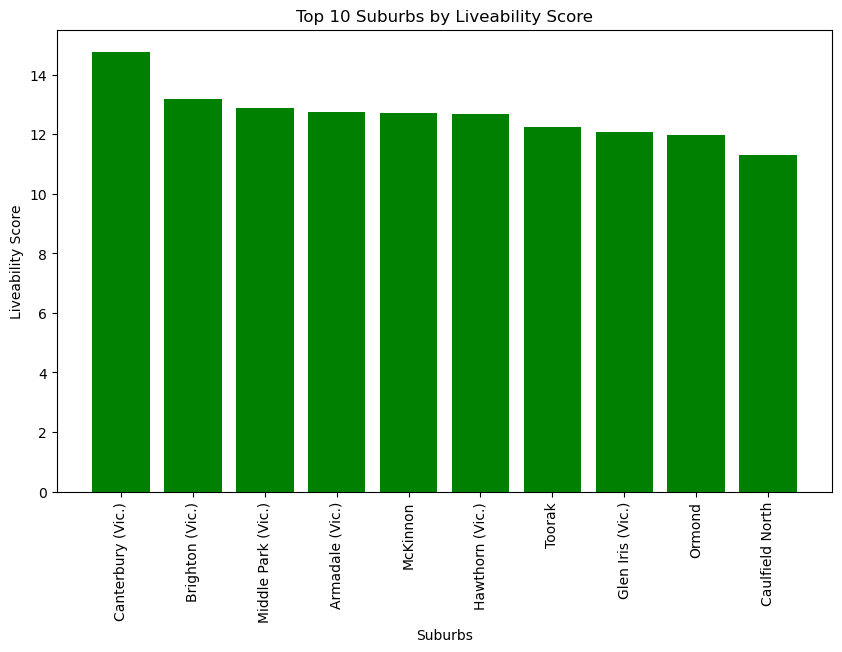

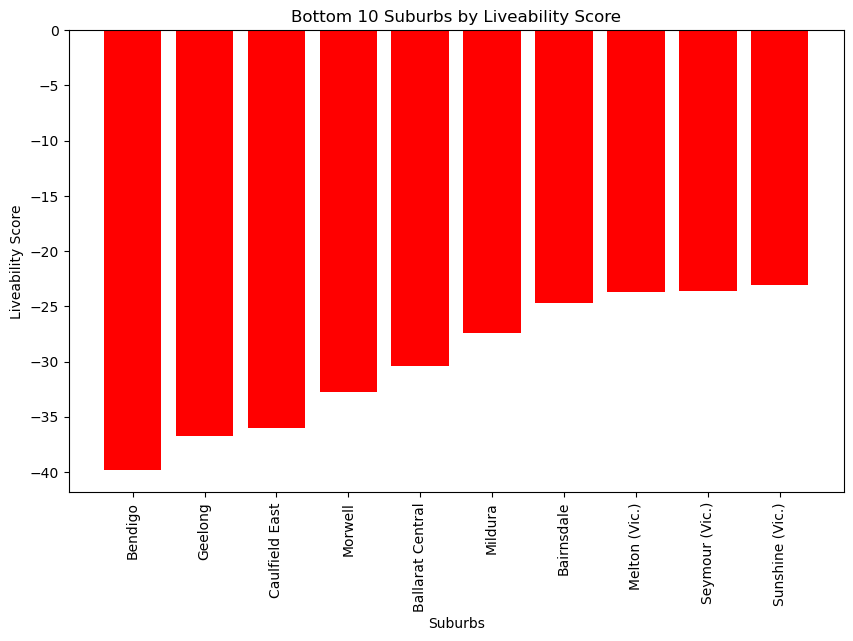

In [42]:
# Bar graph of liveability scores for top ten suburbs
plt.figure(figsize=(10, 6))
plt.bar(top_ten['SAL_NAME21'], top_ten['liveability_score'], color='green')
plt.xlabel('Suburbs')
plt.ylabel('Liveability Score')
plt.title('Top 10 Suburbs by Liveability Score')
plt.xticks(rotation=90)

plt.savefig(f'../plots/top_ten_liveability_scores_2024.png')


plt.show()

# Bar graph of liveability scores for bottom ten suburbs
plt.figure(figsize=(10, 6))
plt.bar(bottom_ten['SAL_NAME21'], bottom_ten['liveability_score'], color='red')
plt.xlabel('Suburbs')
plt.ylabel('Liveability Score')
plt.title('Bottom 10 Suburbs by Liveability Score')
plt.xticks(rotation=90)

plt.savefig(f'../plots/bottom_ten_liveability_scores.png')

plt.show()